In [58]:
import mne # package for reading edf data
import numpy as np
import pandas as pd
import json
import matplotlib.pyplot as plt
# import pyeeg
from scipy.signal import butter, sosfiltfilt, sosfreqz  

from data_tools import * # i made all the functions into a python file"

In [75]:
subject = 2
trial = 3
fs = 1000.      # sampling rate
lowcut = 0.1    # 0.1 Hz is the lowest frequency we will pass
highcut = 30    # 30 is our highest 
order=2         # TODO figure out the optimal order for the future


df = get_recording_events(subject, trial)
df = df[df.song_clip==29].drop(columns=['song_clip','Number','TARGET','time'])
df

Extracting EDF parameters from c:\Users\Staro\Documents\GitHub\COGS189-final-project\data\sub-02\eeg\sub-02_task-run3_eeg.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
c:\Users\Staro\Documents\GitHub\COGS189-final-project\data_tools.py:17: RuntimeWarning: Invalid date encountered (2014-00-00 00:00:00).
  data = mne.io.read_raw_edf(file)


,FP1,FP2,F7,F3,Fz,F4,F8,T3,C3,Cz,C4,T4,T5,P3,Pz,P4,T6,O1,O2
0,-149.623601,-111.775574,49.314735,-1.279259,-65.707514,-49.011326,-12.416786,10.371734,-32.831533,-28.469000,-12.807568,9.759761,-35.782211,-16.815982,8.581891,72.525610,49.671773,102.469989,-2.850259
1,-173.877896,-116.794177,33.418188,-1.556187,-69.779909,-51.001599,-13.867926,31.866286,-24.871664,-25.202006,-11.848305,12.467998,-16.045504,-4.362878,12.894548,76.087524,50.927955,112.681901,2.977428
2,-175.805390,-118.389954,64.473467,-7.593208,-69.412832,-52.480088,-16.696420,13.820617,-5.290389,-25.539442,-15.896393,9.736810,-9.136154,3.951592,12.663714,72.600796,39.190897,109.743665,-2.839427
3,-170.906344,-119.754459,54.479436,-3.910071,-68.782323,-53.006089,-20.090613,-8.301004,1.594897,-25.505698,-18.966032,4.871165,-7.288654,6.899788,14.493496,71.651578,32.960740,111.808649,-2.427806
4,-162.594027,-116.215997,87.748158,-12.411747,-72.142157,-50.020679,-13.720352,21.206103,-17.349589,-25.766444,-14.610981,10.517150,-4.494874,3.421475,13.761583,74.085710,37.845894,114.674970,1.200959
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15996,-246.118752,-71.002319,-68.266054,-88.566823,-9.384956,-2.481576,-35.143119,-33.627648,-80.909136,-21.091422,-37.000165,17.976275,-37.900077,-38.746095,7.382679,61.454542,-5.194215,76.097780,-10.216109
15997,-243.147199,-67.764510,-65.784314,-91.696104,-7.847552,0.247942,-32.708155,-32.547695,-83.615492,-22.468774,-38.189650,15.956573,-39.056642,-39.899332,7.804937,62.206397,-1.501800,74.001975,-4.648393
15998,-236.400971,-61.473912,-61.089132,-105.459403,-3.969492,1.484755,-28.600690,-30.736161,-84.610475,-21.839916,-37.901871,11.595854,-35.586947,-36.662827,7.652924,63.578533,-2.757982,86.124767,2.825779
15999,-238.248153,-61.867074,-58.808614,-96.902342,-4.798654,2.167134,-27.493888,-31.676765,-80.391745,-20.373604,-39.264024,14.900820,-33.499122,-33.435622,10.715699,64.264601,-2.757982,92.422455,3.248232


<AxesSubplot:>

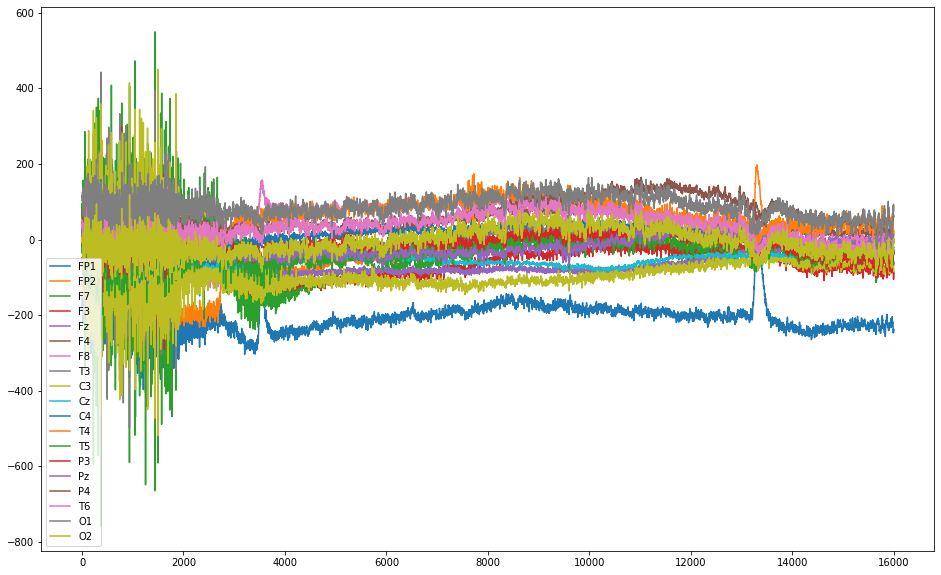

In [60]:
df.plot(figsize=(16,10), title='raw eeg readings') # this is too raw to use!

<AxesSubplot:>

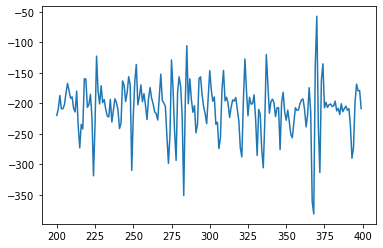

In [63]:
df.FP1[200:400].plot() # lets take a stare at a smaller segment

In [65]:
# this will be our bread and butter
def butter_bandpass(lowcut, highcut, fs, order = 2):
        nyq = 0.5 * fs
        low = lowcut / nyq
        high = highcut / nyq
        sos = butter(order, [low, high], analog = False, btype = 'band', output = 'sos')
        return sos

def butter_bandpass_filter(data, lowcut, highcut, fs, order = 2):
        sos = butter_bandpass(lowcut, highcut, fs, order = order)
        y = sosfiltfilt(sos, data)
        return y

<AxesSubplot:title={'center':'filtered eeg readings (between .1 and 30 hz)'}>

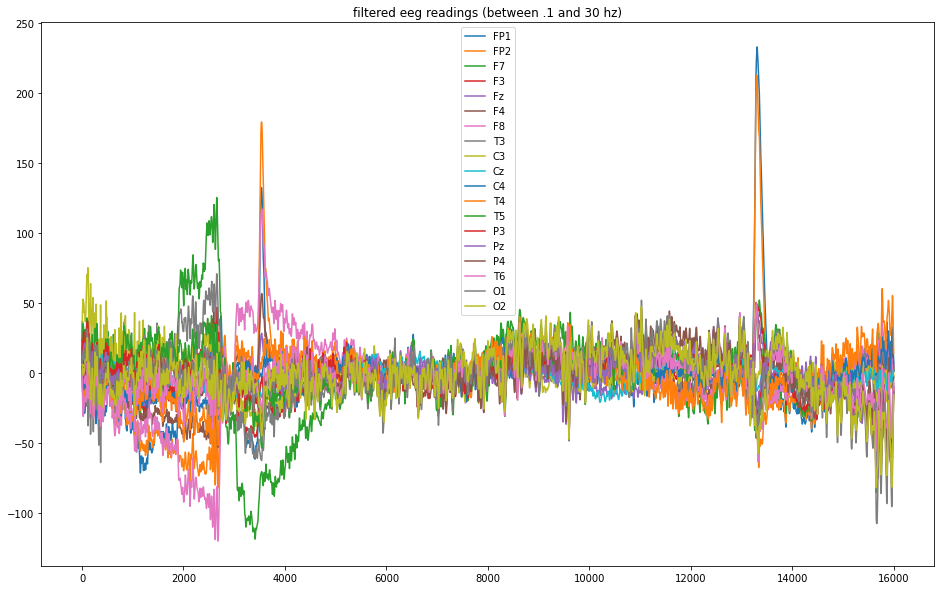

In [81]:
# from 0.1 to 30 hz
filtered_df = df.apply(lambda x: butter_bandpass_filter(x, lowcut, highcut, fs, order))
filtered_df.plot(figsize=(16,10), title='filtered eeg readings (between .1 and 30 hz)')

<AxesSubplot:title={'center':'delta graph'}>

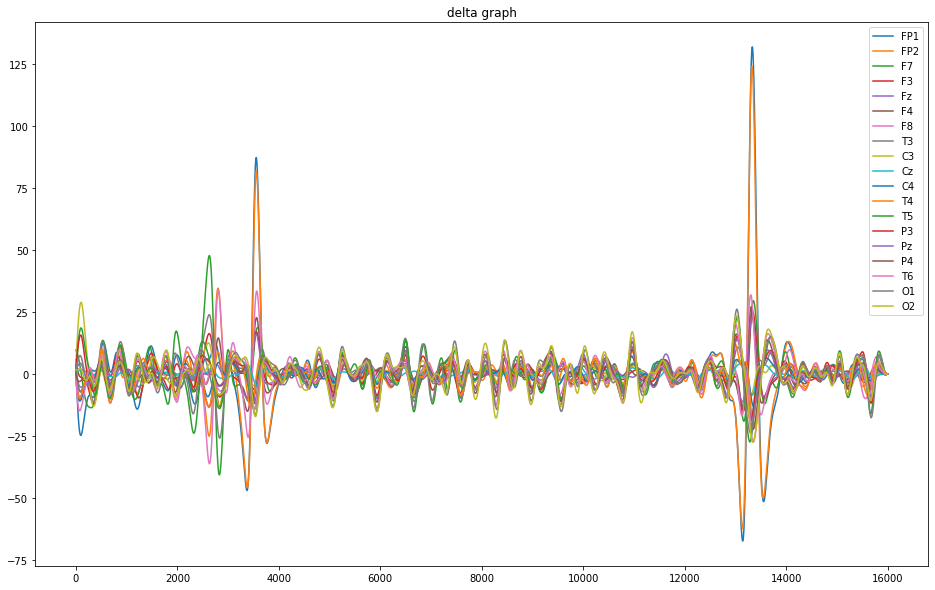

In [77]:
# from 1 to 4 hz (delta)
deltadf = df.apply(lambda x: butter_bandpass_filter(x, 1, 4, fs, order))
deltadf.plot(title='delta graph',figsize=(16,10))

<AxesSubplot:title={'center':'theta graph'}>

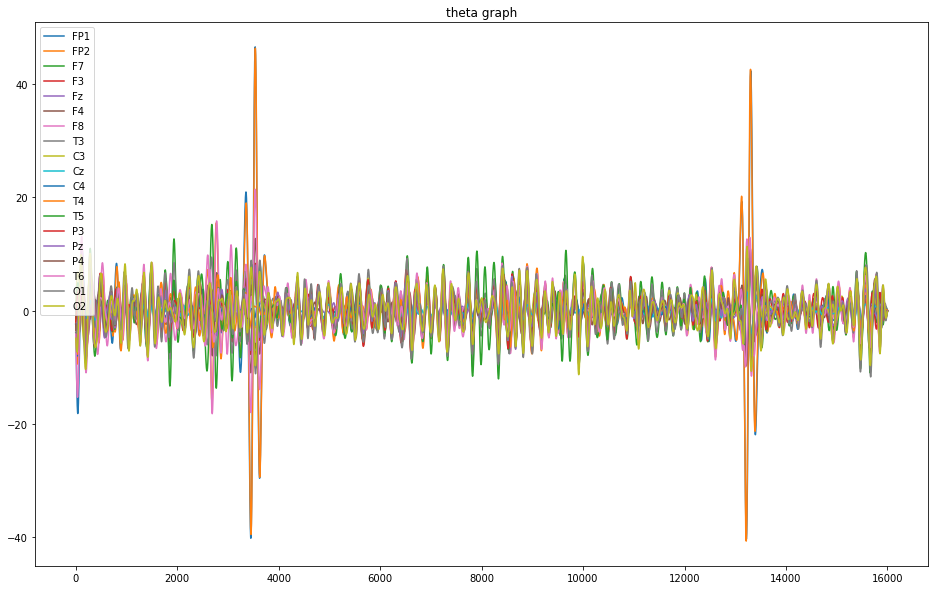

In [78]:
# from 4 to 8 hz (theta)
thetadf = df.apply(lambda x: butter_bandpass_filter(x, 4, 8, fs, order))
thetadf.plot(title='theta graph',figsize=(16,10))

<AxesSubplot:title={'center':'alpha graph'}>

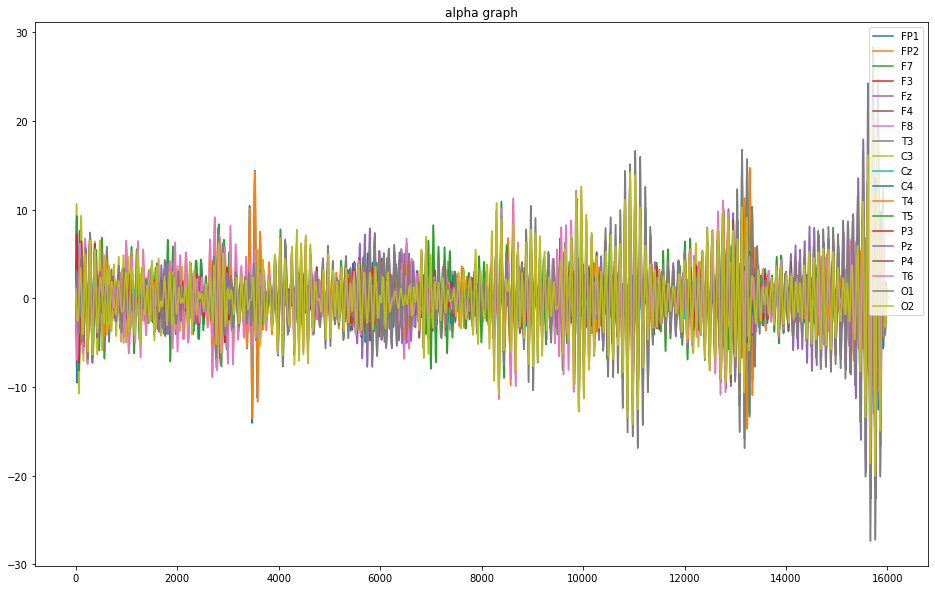

In [79]:
# from 8 to 12 hz (alpha)
alphadf = df.apply(lambda x: butter_bandpass_filter(x, 8, 12, fs, order))
alphadf.plot(title='alpha graph',figsize=(16,10))

<AxesSubplot:title={'center':'beta graph'}>

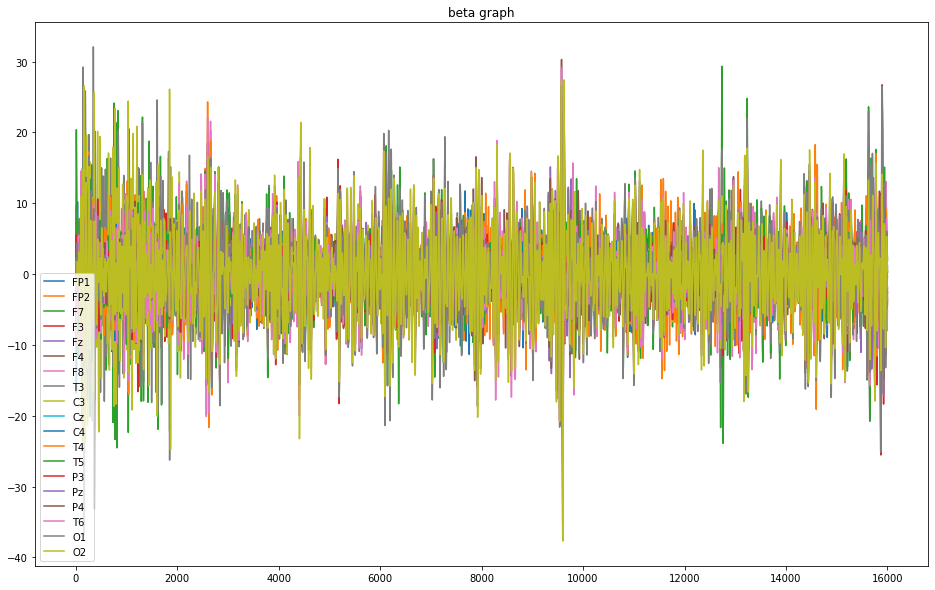

In [80]:
# from 12 to 30 hz (beta)
betadf = df.apply(lambda x: butter_bandpass_filter(x, 12, 30, fs, order))
betadf.plot(title='beta graph',figsize=(16,10))

what I plan to do is to 

1. split the data by band pass filters, resulting in a dataframe of 16000 rows of alpha, beta, and theta values at each point DONE


# Feature Space Ideas: 
- descriptive statistics for important eeg nodes
- correlations between nodes
- alpha and theta levels? possibly beta? done
- fast fourier? done
- dwt? 


## --prototyping garbage below--

Delta
Theta
Alpha
Beta
Gamma


Text(0, 0.5, 'Mean band Amplitude')

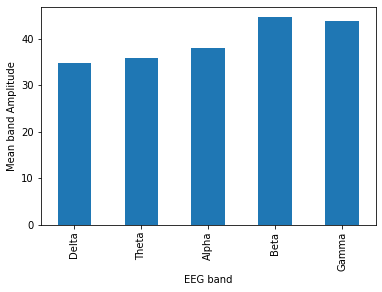

In [71]:

# data = np.random.uniform(0, 100, 1024)  # 2 sec of data b/w 0.0-100.0

# Get real amplitudes of FFT (only in postive frequencies)
fft_vals = np.absolute(np.fft.rfft(df[['Cz']]))

# Get frequencies for amplitudes in Hz
fft_freq = np.fft.rfftfreq(len(df[['Cz']]), 1.0/fs)
eeg_bands = {'Delta': (0, 4),
             'Theta': (4, 8),
             'Alpha': (8, 12),
             'Beta': (12, 30),
             'Gamma': (30, 45)}

# Take the mean of the fft amplitude for each EEG band
eeg_band_fft = {}
for band in eeg_bands.keys():  
    print(band)
    freq_ix = np.where((fft_freq >= eeg_bands[band][0]) & 
                       (fft_freq <= eeg_bands[band][1]))[0]
    eeg_band_fft[band] = np.max(fft_vals[freq_ix])

# Plot the data (using pandas here cause it's easy)
import pandas as pd
df_ = pd.DataFrame(columns=['band', 'val'])
df_['band'] = eeg_bands.keys()
df_['val'] = [eeg_band_fft[band] for band in eeg_bands.keys()]
ax = df_.plot.bar(x='band', y='val', legend=False)
ax.set_xlabel("EEG band")
ax.set_ylabel("Mean band Amplitude")

In [72]:
np.fft.rfft(df[['Cz']])

array([[-28.46900003+0.j],
       [-25.202006  +0.j],
       [-25.539442  +0.j],
       ...,
       [-21.83991637+0.j],
       [-20.37360356+0.j],
       [-20.99325877+0.j]])

In [73]:
df[['Cz']]

,Cz
0,-28.469000
1,-25.202006
2,-25.539442
3,-25.505698
4,-25.766444
...,...
15996,-21.091422
15997,-22.468774
15998,-21.839916
15999,-20.373604


In [74]:
def power_level(x_):
    x = np.abs(x_)
    if 0<=x and x<4:
        return 'delta'#0 #delta
    if 4<=x and x<8:
        return 'theta'#1 #theta
    if 8<=x and x<12:
        return 'alpha'#2 #alpha
    if 12<=x and x<30:
        return 'beta'#3 #beta 
    if 30<x:
        return 'gamma'#4 #gamma
    # return 'omega_lul'#-1 #omega (couldnt classify under any of them)
# testdf = testdf.merge(testdf.applymap(power_level), left_index=True, right_index=True, suffixes=['','_power'])
testdf

NameError: name 'testdf' is not defined